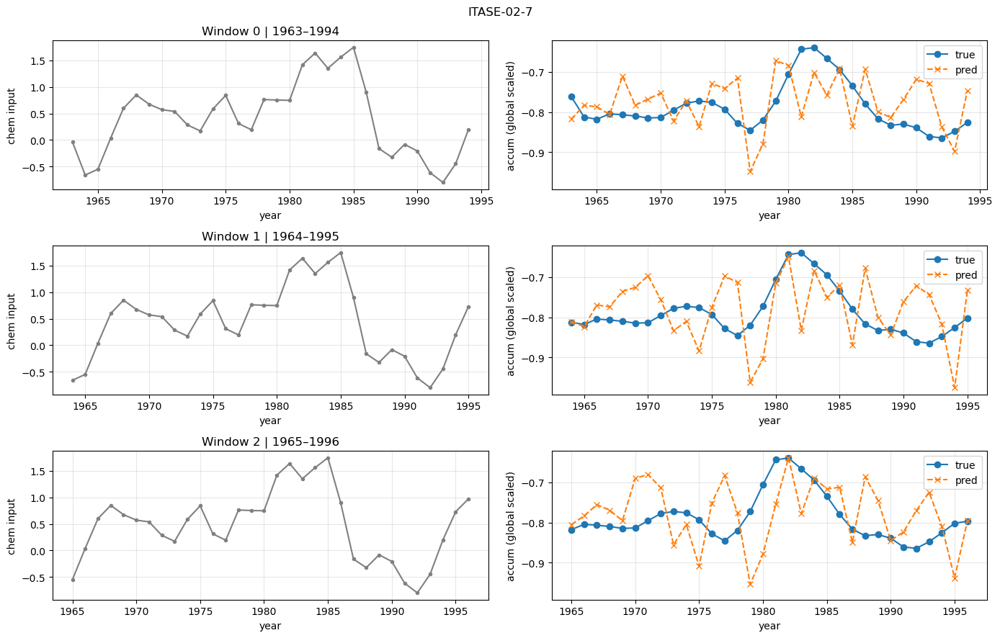

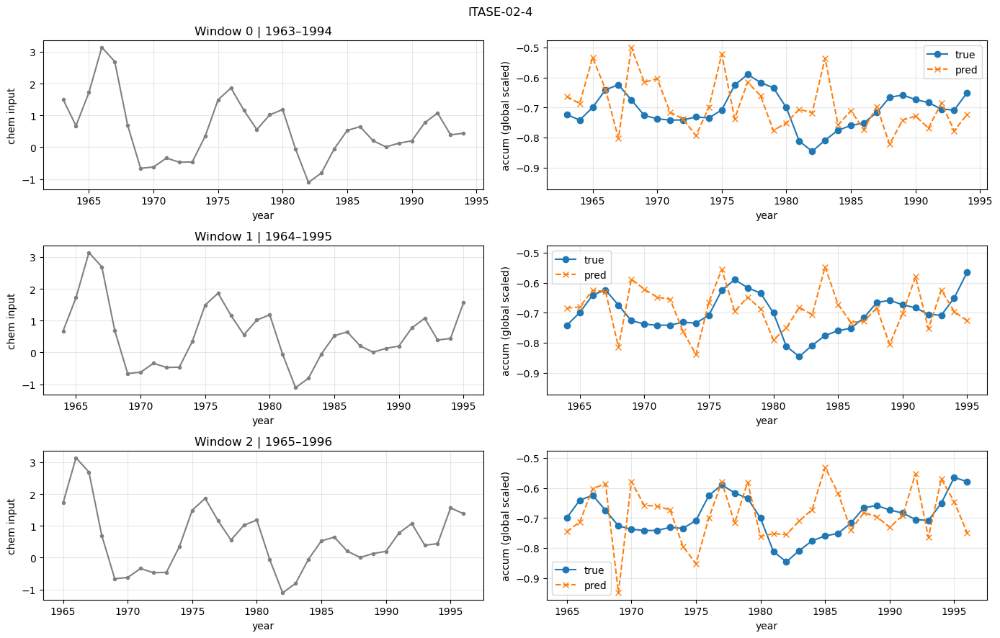

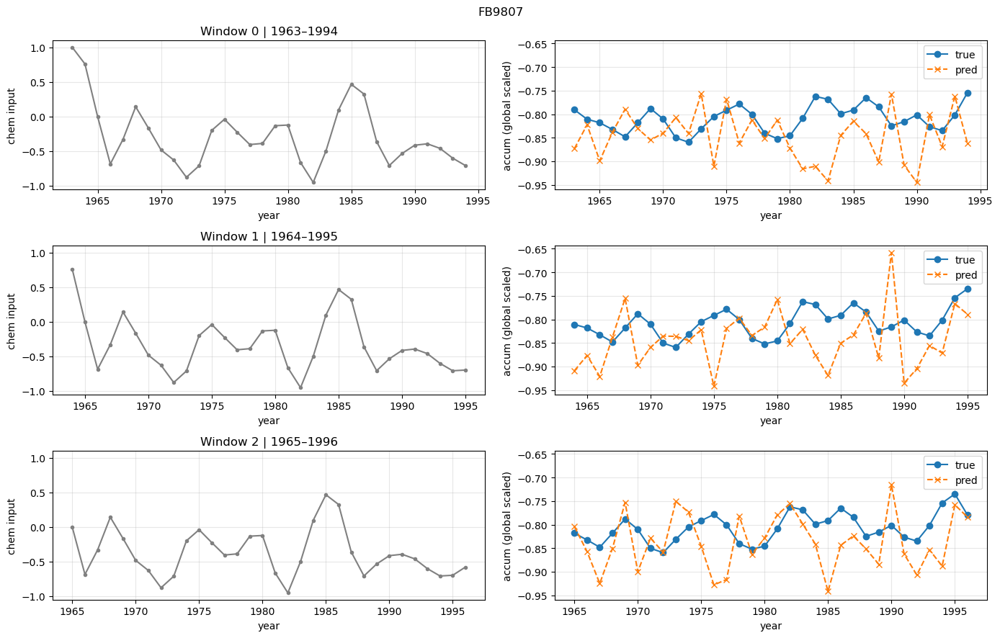

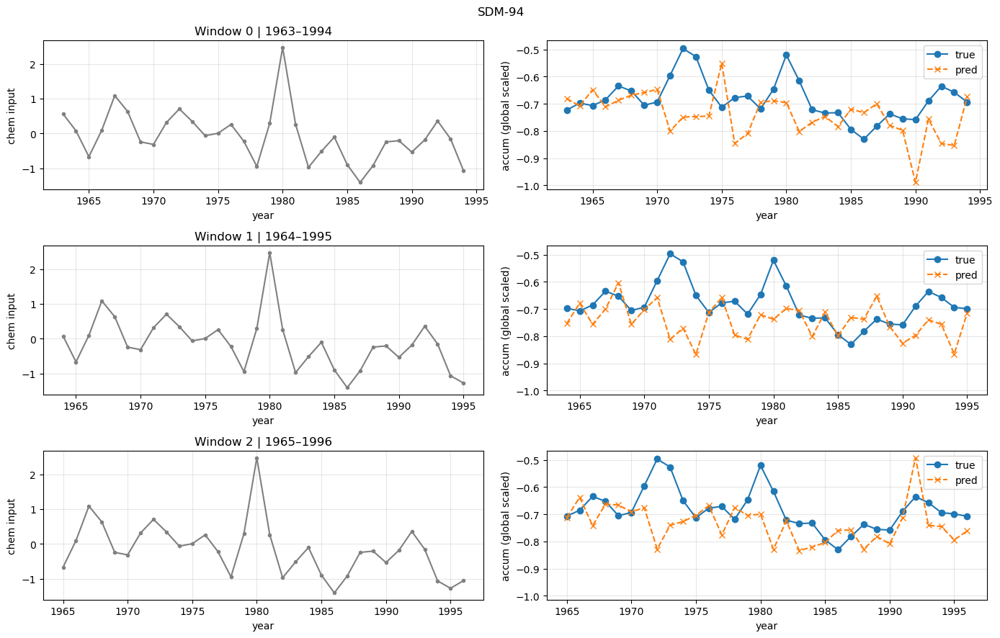

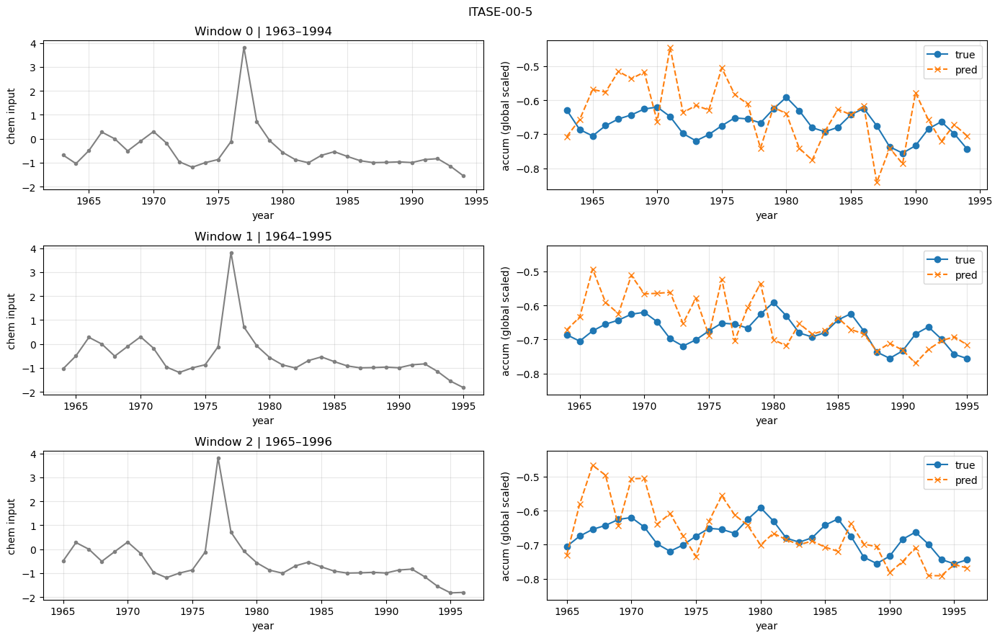

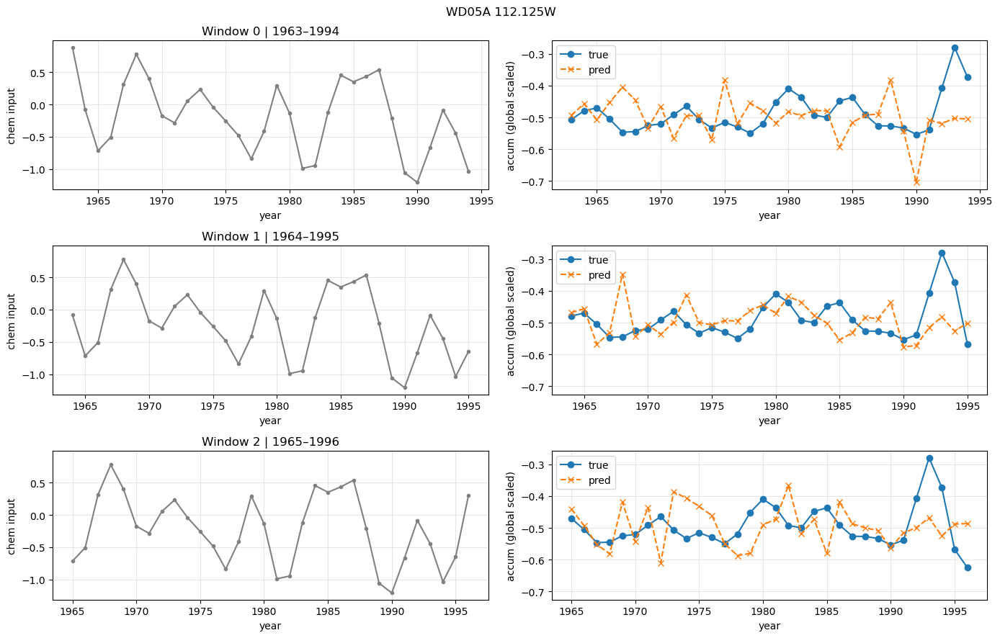

In [2]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

npz_path = Path(
    "/Users/liulei/Desktop/SEMPO_copy0707/results/"
    "cv_chem_decoder_grad_no_revin_no_memory/fold_0/results.npz"
)

with np.load(npz_path, allow_pickle=True) as d:
    sites = d["sites"].astype(str)
    inputs = d["inputs"]
    preds = d["preds"]
    trues = d["trues"]
    starts = d["years"].reshape(-1).astype(int)

# 按文件中的首次出现顺序遍历站点
for site in dict.fromkeys(sites):
    indices = np.flatnonzero(sites == site)
    indices = indices[np.argsort(starts[indices])]

    fig, axes = plt.subplots(
        len(indices), 2,
        figsize=(14, 3 * len(indices)),
        squeeze=False,
        sharey="col",
    )

    for row, i in enumerate(indices):
        x = inputs[i, :, 0]
        p = preds[i, :, 0]
        y = trues[i, :, 0]

        x_years = starts[i] + np.arange(len(x))
        y_years = starts[i] + np.arange(len(y))

        axes[row, 0].plot(x_years, x, ".-", color="gray")
        axes[row, 0].set_ylabel("chem input")
        axes[row, 0].set_title(
            f"Window {row} | {starts[i]}–{y_years[-1]}"
        )

        axes[row, 1].plot(y_years, y, "o-", label="true")
        axes[row, 1].plot(y_years, p, "x--", label="pred")
        axes[row, 1].set_ylabel("accum (global scaled)")
        axes[row, 1].legend()

        for ax in axes[row]:
            ax.set_xlabel("year")
            ax.grid(alpha=0.3)

    fig.suptitle(site)
    fig.tight_layout()
    plt.show()
    plt.close(fig)

ITASE-02-7 | 同年预测分歧 RMS=0.0251
分歧 / 真实曲线标准差=0.414
分歧最大年份：1966，各窗口预测：[-0.7956 -0.7512 -0.6841]


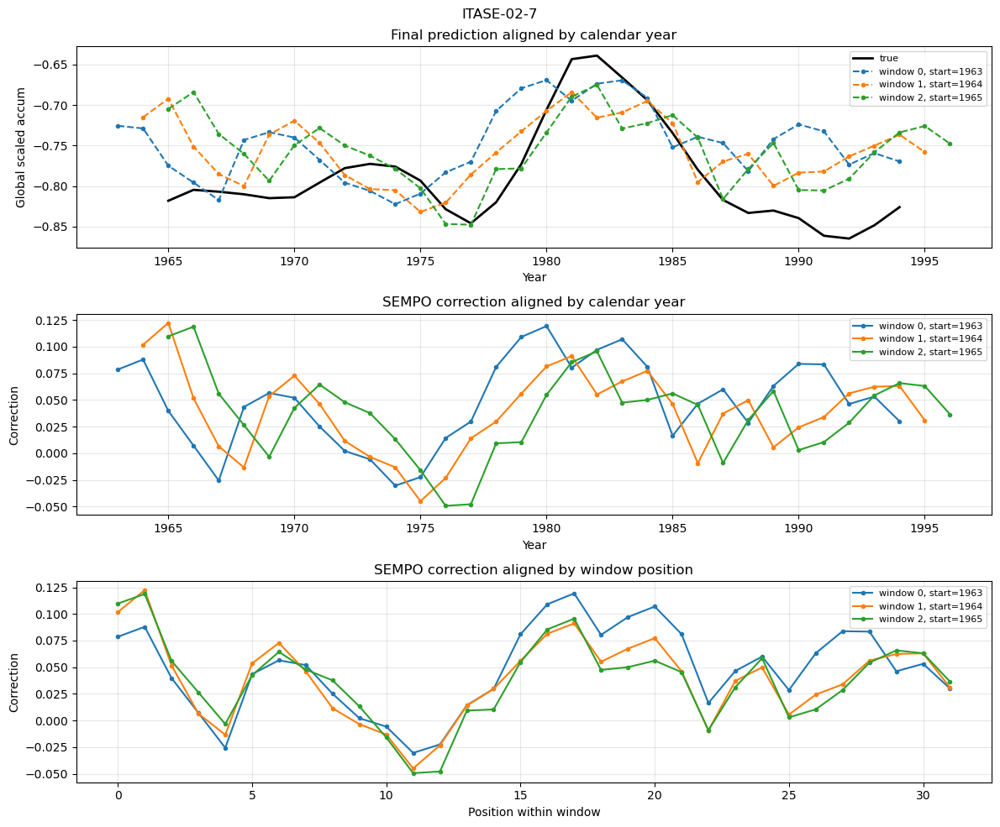

In [9]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

npz_path = Path(
    "/Users/liulei/Desktop/SEMPO_copy0707/results/"
    "cv_chem_linear_residual_no_projection/fold_0/results.npz"
)
site = "ITASE-02-7"

with np.load(npz_path, allow_pickle=True) as d:
    mask = d["sites"].astype(str) == site
    if not mask.any():
        raise ValueError(f"这个 fold 没有站点：{site}")

    starts = d["years"][mask].reshape(-1).astype(int)
    order = np.argsort(starts)
    starts = starts[order]
    pred = d["preds"][mask][order, :, 0]
    true = d["trues"][mask][order, :, 0]

    j = np.flatnonzero(d["crossvar_full_sites"].astype(str) == site)[0]
    x_full = np.asarray(d["crossvar_full_x"][j], float).reshape(-1)
    y_full = np.asarray(d["crossvar_full_y"][j], float).reshape(-1)
    full_years = np.asarray(d["crossvar_full_years"][j], int).reshape(-1)
    support_len = int(d["crossvar_full_support_lens"][j])

# 在全局缩放尺度拟合带截距直线：
# 与 support 标准化 x、目标减 anchor 后拟合再还原等价。
x_support = x_full[:support_len]
y_support = y_full[:support_len]
a, b = np.linalg.lstsq(
    np.column_stack([x_support, np.ones_like(x_support)]),
    y_support,
    rcond=None,
)[0]

years = starts[:, None] + np.arange(pred.shape[1])
indices = np.searchsorted(full_years, years)
assert np.array_equal(full_years[indices], years)
assert np.allclose(y_full[indices], true)

linear = a * x_full[indices] + b
correction = pred - linear

# 只比较所有窗口共同覆盖的年份，避免边界覆盖次数不同。
common_years = np.arange(years[:, 0].max(), years[:, -1].min() + 1)
aligned_pred = np.stack([
    np.interp(common_years, years[i], pred[i])
    for i in range(len(pred))
])
aligned_true = np.interp(common_years, years[0], true[0])

# 每年在不同窗口间的标准差，再计算跨年份均方根。
spread = aligned_pred.std(axis=0)
disagreement = np.sqrt(np.mean(spread**2))
ratio = disagreement / max(aligned_true.std(), 1e-12)
worst = np.argmax(spread)

print(f"{site} | 同年预测分歧 RMS={disagreement:.4f}")
print(f"分歧 / 真实曲线标准差={ratio:.3f}")
print(
    f"分歧最大年份：{common_years[worst]}，"
    f"各窗口预测：{np.round(aligned_pred[:, worst], 4)}"
)

fig, axes = plt.subplots(3, 1, figsize=(12, 10))

axes[0].plot(common_years, aligned_true, "k-", lw=2, label="true")
for i in range(len(pred)):
    label = f"window {i}, start={starts[i]}"
    axes[0].plot(years[i], pred[i], ".--", label=label)
    axes[1].plot(years[i], correction[i], ".-", label=label)
    axes[2].plot(np.arange(pred.shape[1]), correction[i], ".-", label=label)

axes[0].set_title("Final prediction aligned by calendar year")
axes[1].set_title("SEMPO correction aligned by calendar year")
axes[2].set_title("SEMPO correction aligned by window position")
axes[0].set_ylabel("Global scaled accum")
axes[1].set_ylabel("Correction")
axes[2].set_ylabel("Correction")

for i, ax in enumerate(axes):
    ax.set_xlabel("Year" if i < 2 else "Position within window")
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

fig.suptitle(site)
fig.tight_layout()
plt.show()

With input projection | ITASE-02-7 | window 0 | linear MAE=0.0360 | combined MAE=0.0512 | residual corr=0.259
Without input projection | ITASE-02-7 | window 0 | linear MAE=0.0360 | combined MAE=0.0547 | residual corr=0.375


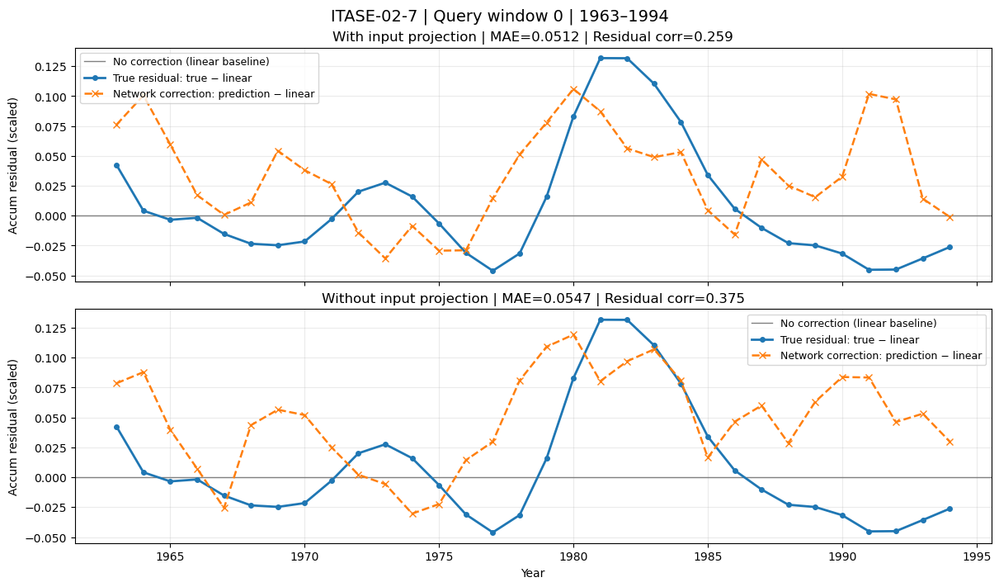

In [8]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

root = Path("/Users/liulei/Desktop/SEMPO_copy0707")
experiments = [
    ("With input projection", "cv_chem_linear_residual"),
    ("Without input projection", "cv_chem_linear_residual_no_projection"),
]

site = "ITASE-02-7"
window_id = 0       # 按开始年份排序后的窗口编号：0、1、2
save_dir = None     # 或 root / "figures" / "projection_comparison"

curves = []

for label, folder in experiments:
    path = root / "results" / folder / "fold_0" / "results.npz"

    with np.load(path, allow_pickle=True) as d:
        mask = d["sites"].astype(str) == site
        if not mask.any():
            raise ValueError(f"{folder} 中没有站点 {site}")

        starts = d["years"][mask].reshape(-1).astype(int)
        order = np.argsort(starts)
        if not 0 <= window_id < len(order):
            raise ValueError(f"窗口编号应在 0–{len(order) - 1} 之间")

        idx = order[window_id]
        pred = d["preds"][mask][idx, :, 0].astype(float)
        true = d["trues"][mask][idx, :, 0].astype(float)
        years = starts[idx] + np.arange(len(true))

        full_sites = d["crossvar_full_sites"].astype(str).tolist()
        j = full_sites.index(site)

        x_full = np.asarray(d["crossvar_full_x"][j], float).reshape(-1)
        y_full = np.asarray(d["crossvar_full_y"][j], float).reshape(-1)
        years_full = np.asarray(
            d["crossvar_full_years"][j], int
        ).reshape(-1)
        support_len = int(d["crossvar_full_support_lens"][j])

        # 只用 support 的唯一年份拟合线性基线。
        xs = x_full[:support_len]
        ys = y_full[:support_len]
        xc = xs - xs.mean()
        denominator = np.dot(xc, xc)
        a = (
            np.dot(xc, ys - ys.mean()) / denominator
            if denominator > 1e-12 else 0.0
        )
        b = ys.mean() - a * xs.mean()

        indices = np.searchsorted(years_full, years)
        assert np.all(indices < len(years_full))
        assert np.array_equal(years_full[indices], years)
        assert np.allclose(y_full[indices], true, atol=1e-5)

        linear = a * x_full[indices] + b
        residual = true - linear
        correction = pred - linear

        curves.append({
            "label": label,
            "years": years,
            "true": true,
            "linear": linear,
            "residual": residual,
            "correction": correction,
        })

# 确保两版比较的是同一窗口、同一真值和同一线性基线。
first, second = curves
assert np.array_equal(first["years"], second["years"])
assert np.allclose(first["true"], second["true"], atol=1e-5)
assert np.allclose(first["linear"], second["linear"], atol=1e-5)

fig, axes = plt.subplots(
    2, 1,
    figsize=(12, 7),
    sharex=True,
    sharey=True,
    constrained_layout=True,
)

for ax, curve in zip(axes, curves):
    years = curve["years"]
    residual = curve["residual"]
    correction = curve["correction"]

    # 等价于组合预测与真实 accum 的 MAE。
    mae = np.abs(correction - residual).mean()
    linear_mae = np.abs(residual).mean()
    corr = (
        np.corrcoef(correction, residual)[0, 1]
        if correction.std() > 1e-12 and residual.std() > 1e-12
        else np.nan
    )

    ax.axhline(
        0, color="gray", linewidth=1,
        label="No correction (linear baseline)",
    )
    ax.plot(
        years, residual, "o-",
        color="tab:blue", markersize=4, linewidth=2,
        label="True residual: true − linear",
    )
    ax.plot(
        years, correction, "x--",
        color="tab:orange", linewidth=1.8,
        label="Network correction: prediction − linear",
    )

    ax.set_title(
        f"{curve['label']} | MAE={mae:.4f} | Residual corr={corr:.3f}"
    )
    ax.set_ylabel("Accum residual (scaled)")
    ax.grid(alpha=0.25)
    ax.legend(loc="best", fontsize=9)

    print(
        f"{curve['label']} | {site} | window {window_id} | "
        f"linear MAE={linear_mae:.4f} | "
        f"combined MAE={mae:.4f} | residual corr={corr:.3f}"
    )

axes[-1].set_xlabel("Year")
fig.suptitle(
    f"{site} | Query window {window_id} | "
    f"{first['years'][0]}–{first['years'][-1]}",
    fontsize=14,
)

if save_dir is not None:
    save_dir.mkdir(parents=True, exist_ok=True)
    filename = f"projection_comparison_window_{window_id}"
    fig.savefig(save_dir / f"{filename}.png", dpi=300)
    fig.savefig(save_dir / f"{filename}.svg")

plt.show()

ITASE-02-7 | 同年预测分歧 RMS=0.0059
分歧 / 真实曲线标准差=0.097
分歧最大年份：1994，各窗口预测：[-0.812  -0.7919 -0.7895]


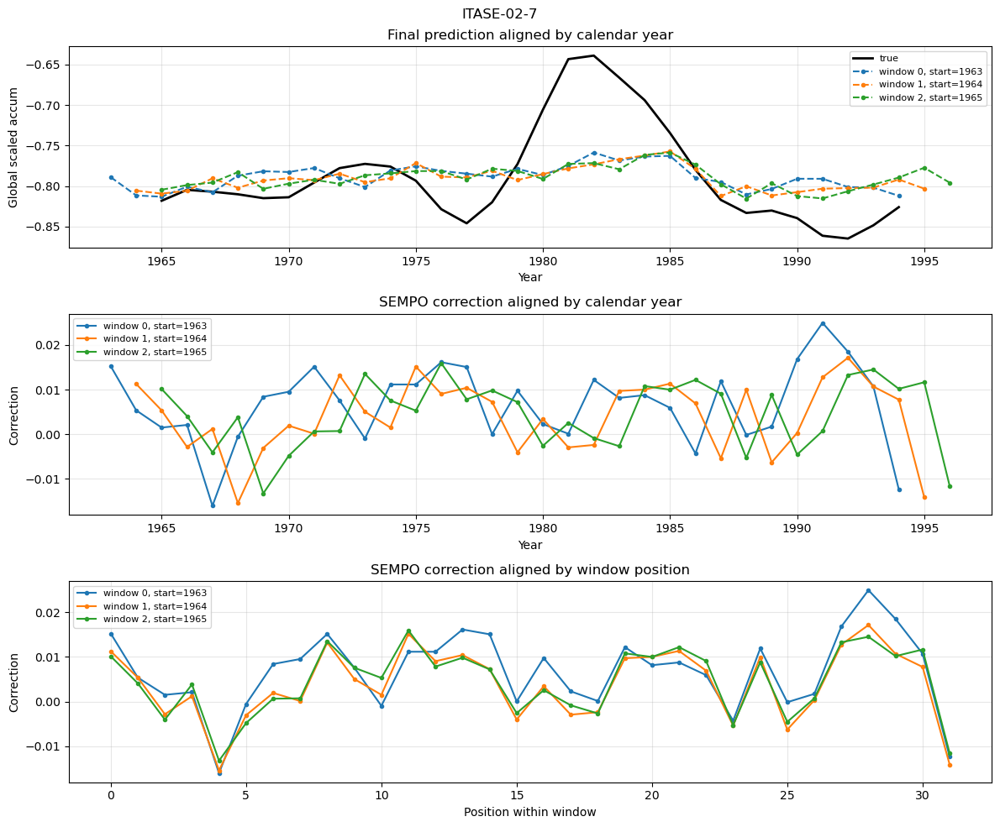

In [3]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

npz_path = Path(
    "/Users/liulei/Desktop/SEMPO_copy0707/results/"
    "cv_chem_linear_residual_no_projection_patch_head/fold_0/results.npz"
)
site = "ITASE-02-7"

with np.load(npz_path, allow_pickle=True) as d:
    mask = d["sites"].astype(str) == site
    if not mask.any():
        raise ValueError(f"这个 fold 没有站点：{site}")

    starts = d["years"][mask].reshape(-1).astype(int)
    order = np.argsort(starts)
    starts = starts[order]
    pred = d["preds"][mask][order, :, 0]
    true = d["trues"][mask][order, :, 0]

    j = np.flatnonzero(d["crossvar_full_sites"].astype(str) == site)[0]
    x_full = np.asarray(d["crossvar_full_x"][j], float).reshape(-1)
    y_full = np.asarray(d["crossvar_full_y"][j], float).reshape(-1)
    full_years = np.asarray(d["crossvar_full_years"][j], int).reshape(-1)
    support_len = int(d["crossvar_full_support_lens"][j])

# 在全局缩放尺度拟合带截距直线：
# 与 support 标准化 x、目标减 anchor 后拟合再还原等价。
x_support = x_full[:support_len]
y_support = y_full[:support_len]
a, b = np.linalg.lstsq(
    np.column_stack([x_support, np.ones_like(x_support)]),
    y_support,
    rcond=None,
)[0]

years = starts[:, None] + np.arange(pred.shape[1])
indices = np.searchsorted(full_years, years)
assert np.array_equal(full_years[indices], years)
assert np.allclose(y_full[indices], true)

linear = a * x_full[indices] + b
correction = pred - linear

# 只比较所有窗口共同覆盖的年份，避免边界覆盖次数不同。
common_years = np.arange(years[:, 0].max(), years[:, -1].min() + 1)
aligned_pred = np.stack([
    np.interp(common_years, years[i], pred[i])
    for i in range(len(pred))
])
aligned_true = np.interp(common_years, years[0], true[0])

# 每年在不同窗口间的标准差，再计算跨年份均方根。
spread = aligned_pred.std(axis=0)
disagreement = np.sqrt(np.mean(spread**2))
ratio = disagreement / max(aligned_true.std(), 1e-12)
worst = np.argmax(spread)

print(f"{site} | 同年预测分歧 RMS={disagreement:.4f}")
print(f"分歧 / 真实曲线标准差={ratio:.3f}")
print(
    f"分歧最大年份：{common_years[worst]}，"
    f"各窗口预测：{np.round(aligned_pred[:, worst], 4)}"
)

fig, axes = plt.subplots(3, 1, figsize=(12, 10))

axes[0].plot(common_years, aligned_true, "k-", lw=2, label="true")
for i in range(len(pred)):
    label = f"window {i}, start={starts[i]}"
    axes[0].plot(years[i], pred[i], ".--", label=label)
    axes[1].plot(years[i], correction[i], ".-", label=label)
    axes[2].plot(np.arange(pred.shape[1]), correction[i], ".-", label=label)

axes[0].set_title("Final prediction aligned by calendar year")
axes[1].set_title("SEMPO correction aligned by calendar year")
axes[2].set_title("SEMPO correction aligned by window position")
axes[0].set_ylabel("Global scaled accum")
axes[1].set_ylabel("Correction")
axes[2].set_ylabel("Correction")

for i, ax in enumerate(axes):
    ax.set_xlabel("Year" if i < 2 else "Position within window")
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

fig.suptitle(site)
fig.tight_layout()
plt.show()

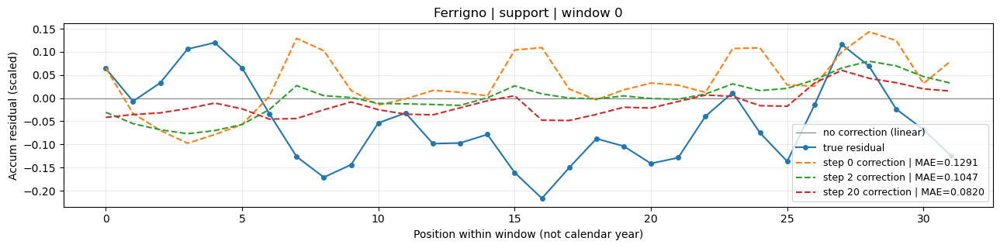

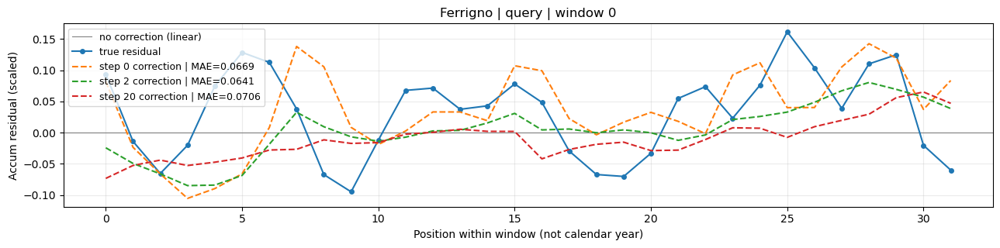

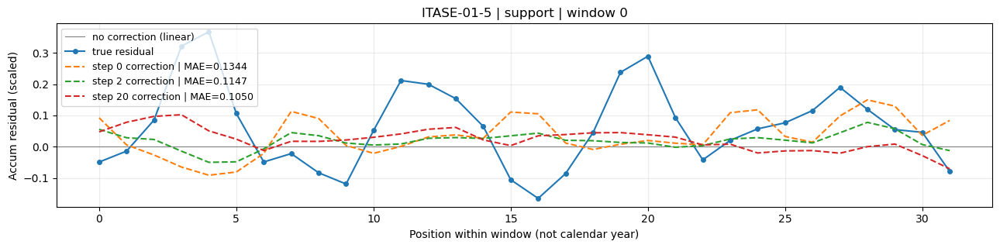

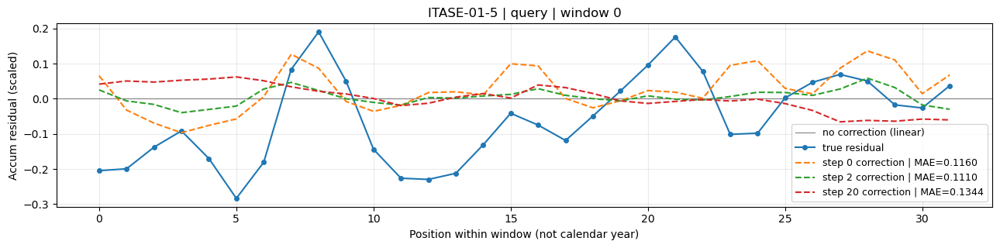

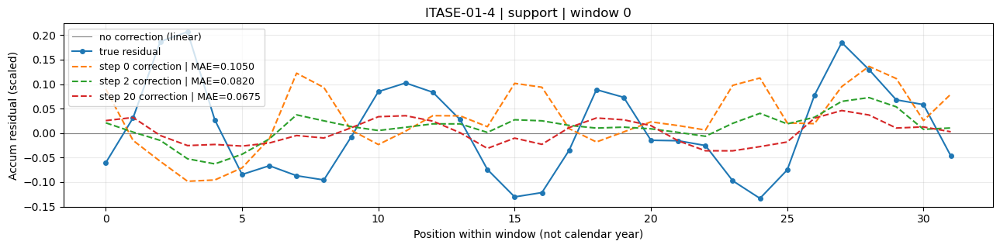

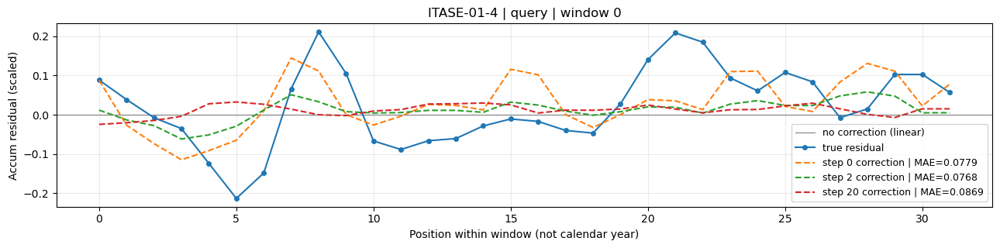

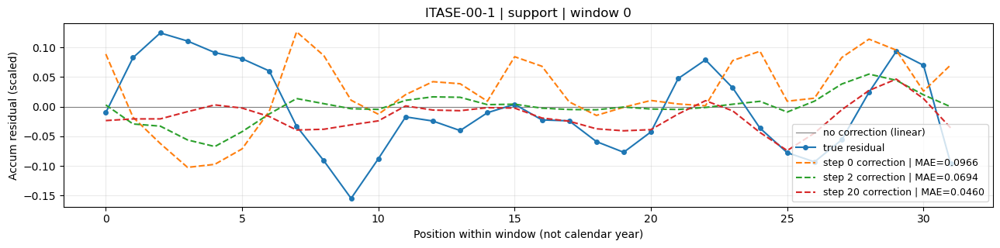

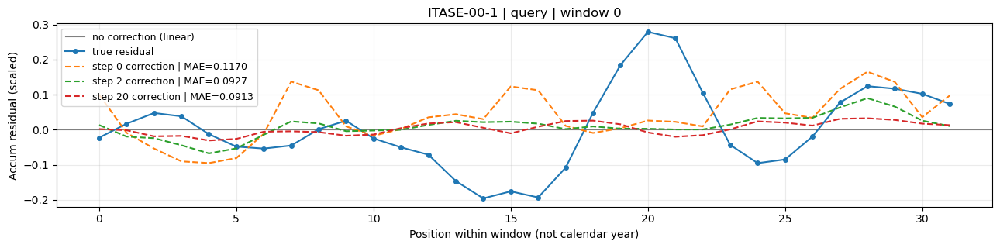

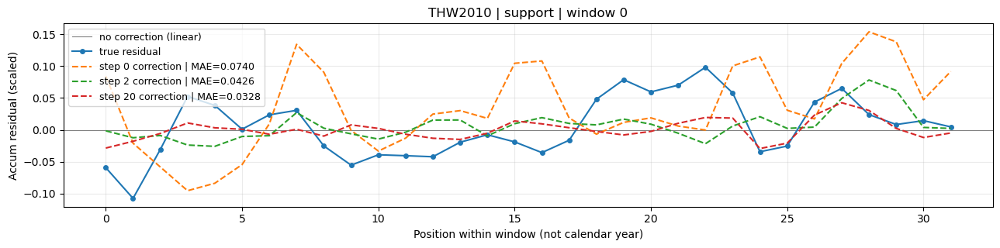

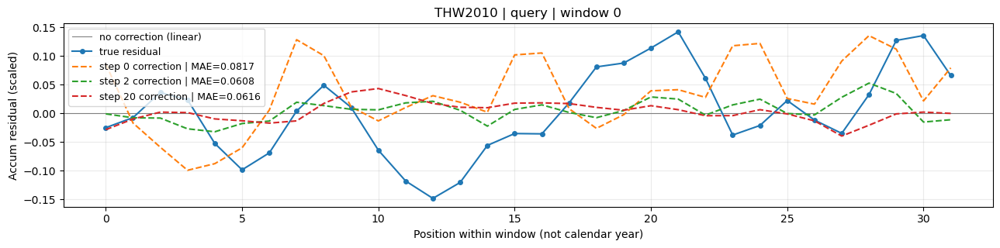

In [4]:
# Validation residuals: true - linear versus model prediction - linear.
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

root = Path("/Users/liulei/Desktop/SEMPO_copy0707")
# If multiple experiments match, replace None with the printed NPZ path.
npz_path = None
if npz_path is None:
    matches = sorted((root / "test_results").glob("**/*fold0/val_residual_steps.npz"))
    if len(matches) != 1:
        raise ValueError(f"Set npz_path to one val_residual_steps.npz; found: {matches}")
    npz_path = matches[0]

sites_to_plot = None  # None = all validation sites; or ["ITASE-01-4", "ITASE-01-5"]
window_ids = [0]     # [0, 1, 2] for more windows; None = all windows
steps = (0, 2, 20)
colors = {0: "tab:orange", 2: "tab:green", 20: "tab:red"}

with np.load(npz_path, allow_pickle=False) as data:
    sites = data["sites"].astype(str).tolist()
    selected = sites if sites_to_plot is None else sites_to_plot
    for site in selected:
        if site not in sites:
            raise ValueError(f"Unknown site {site}; available: {sites}")
        site_idx = sites.index(site)
        for split in ("support", "query"):
            prefix = f"site_{site_idx}_{split}"
            true = data[f"{prefix}_true"][:, :, 0]
            linear = data[f"{prefix}_linear"][:, :, 0]
            residual = true - linear
            corrections = {step: data[f"{prefix}_pred_step{step}"][:, :, 0] - linear
                           for step in steps}
            selected_windows = list(range(len(true))) if window_ids is None else window_ids
            if not selected_windows or any(i < 0 or i >= len(true) for i in selected_windows):
                raise ValueError(f"{site} {split}: valid window indices 0..{len(true)-1}")
            # Four windows per figure keeps all-window plots readable.
            for offset in range(0, len(selected_windows), 4):
                group = selected_windows[offset:offset + 4]
                fig, axes = plt.subplots(len(group), 1, figsize=(13, 3.3 * len(group)),
                                         squeeze=False, sharex=True, sharey=True)
                for ax, i in zip(axes[:, 0], group):
                    ax.axhline(0, color="gray", linewidth=0.8, label="no correction (linear)")
                    ax.plot(residual[i], "o-", color="tab:blue", label="true residual", markersize=4)
                    for step in steps:
                        correction = corrections[step][i]
                        mae = np.abs(correction - residual[i]).mean()
                        ax.plot(correction, "--", color=colors[step],
                                label=f"step {step} correction | MAE={mae:.4f}")
                    ax.set_title(f"{site} | {split} | window {i}")
                    ax.set_ylabel("Accum residual (scaled)")
                    ax.grid(alpha=0.25)
                    ax.legend(fontsize=9)
                axes[-1, 0].set_xlabel("Position within window (not calendar year)")
                fig.tight_layout()
                plt.show()


Ferrigno | step0 | ALL query windows | difference RMS=0.011919 real MAE=0.0749 constant MAE=0.0762
Ferrigno | step2 | ALL query windows | difference RMS=0.009190 real MAE=0.0697 constant MAE=0.0671


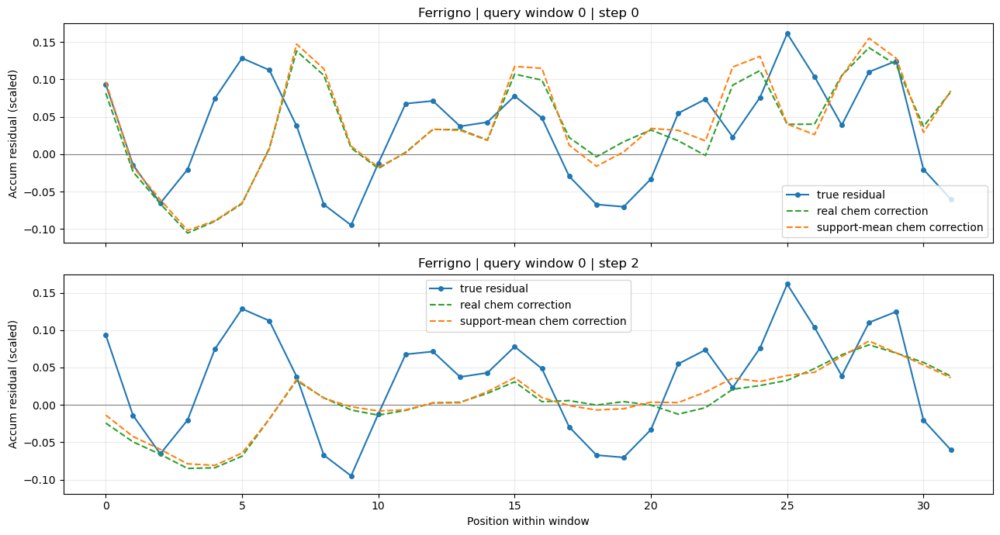

ITASE-01-5 | step0 | ALL query windows | difference RMS=0.014716 real MAE=0.1170 constant MAE=0.1237
ITASE-01-5 | step2 | ALL query windows | difference RMS=0.014619 real MAE=0.1078 constant MAE=0.1114


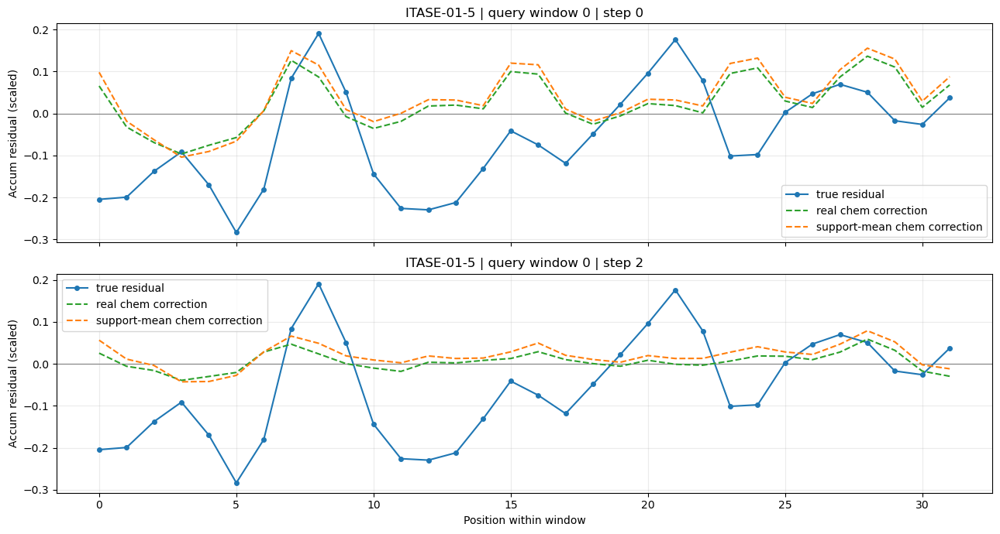

ITASE-01-4 | step0 | ALL query windows | difference RMS=0.009988 real MAE=0.0744 constant MAE=0.0784
ITASE-01-4 | step2 | ALL query windows | difference RMS=0.009868 real MAE=0.0717 constant MAE=0.0717


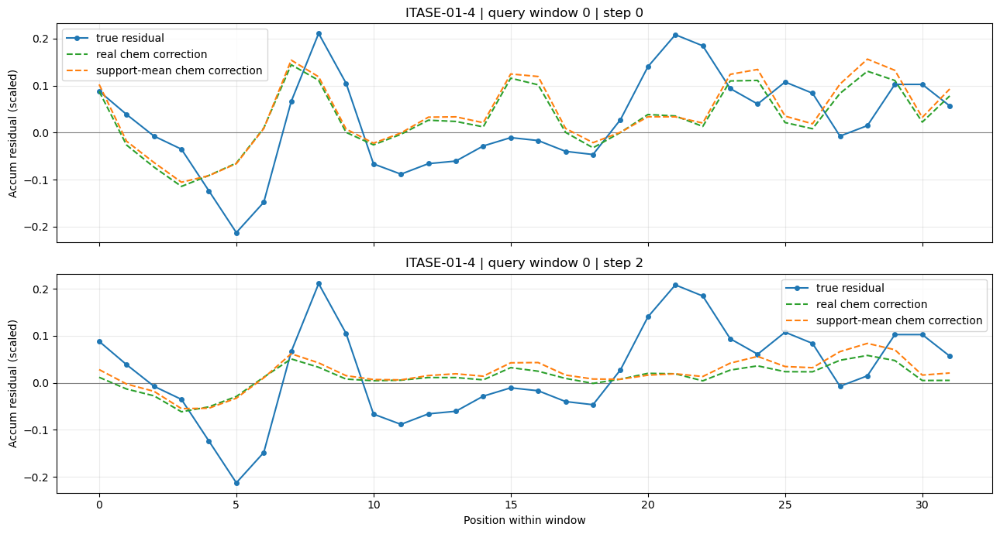

ITASE-00-1 | step0 | ALL query windows | difference RMS=0.009769 real MAE=0.1114 constant MAE=0.1136
ITASE-00-1 | step2 | ALL query windows | difference RMS=0.008165 real MAE=0.0870 constant MAE=0.0879


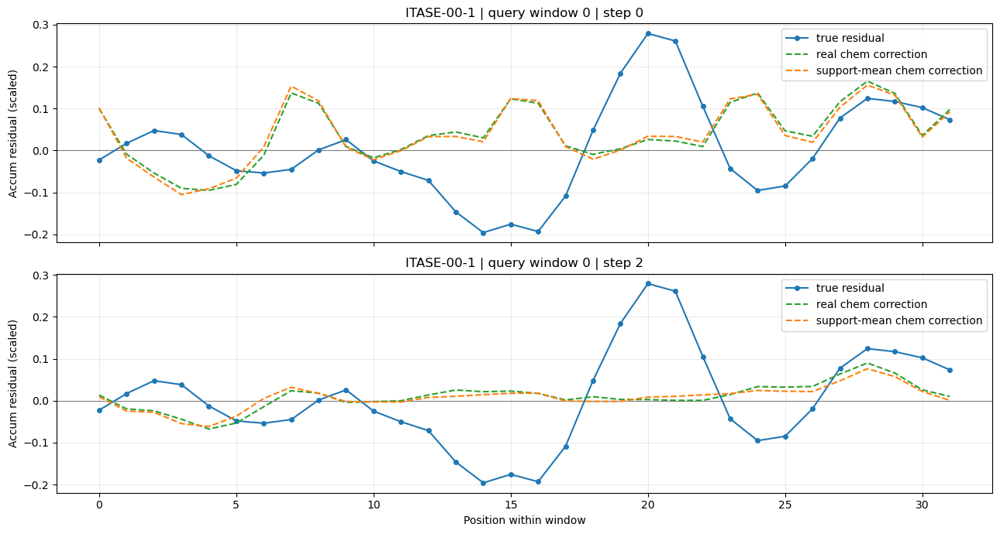

THW2010 | step0 | ALL query windows | difference RMS=0.008764 real MAE=0.0745 constant MAE=0.0782
THW2010 | step2 | ALL query windows | difference RMS=0.006885 real MAE=0.0570 constant MAE=0.0583


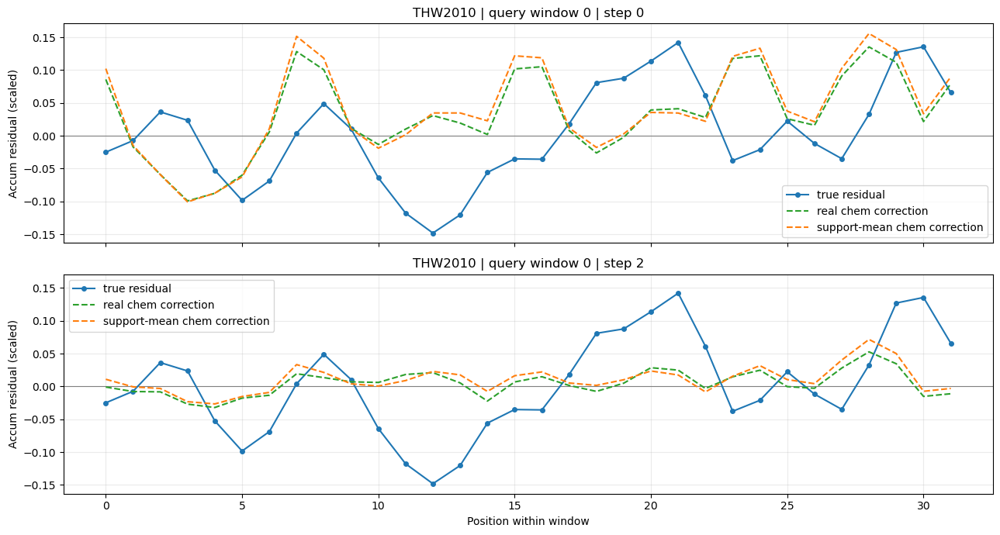

In [5]:
# Query input sensitivity: fixed weights and linear baseline; real chem vs support mean.
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

root = Path("/Users/liulei/Desktop/SEMPO_copy0707")
npz_path = None  # Or Path(".../val_residual_steps.npz")
if npz_path is None:
    matches = sorted((root / "test_results").glob("**/*fold0/val_residual_steps.npz"))
    if len(matches) != 1:
        raise ValueError(f"Set npz_path explicitly; found: {matches}")
    npz_path = matches[0]

sites_to_plot = None  # All validation sites; or ["ITASE-01-4", "ITASE-01-5"]
window_id = 0
with np.load(npz_path, allow_pickle=False) as data:
    sites = data["sites"].astype(str).tolist()
    for site in sites if sites_to_plot is None else sites_to_plot:
        prefix = f"site_{sites.index(site)}_query"
        residual = (data[f"{prefix}_true"] - data[f"{prefix}_linear"])[:, :, 0]
        if not 0 <= window_id < len(residual):
            raise ValueError(f"{site}: window_id must be in 0..{len(residual)-1}")
        fig, axes = plt.subplots(2, 1, figsize=(13, 7), sharex=True, sharey=True)
        for ax, step in zip(axes, (0, 2)):
            key = f"{prefix}_constant_correction_step{step}"
            if key not in data:
                raise ValueError("Old NPZ: rerun --diagnose_val_steps and copy the updated NPZ here.")
            real = (data[f"{prefix}_pred_step{step}"] - data[f"{prefix}_linear"])[:, :, 0]
            constant = data[key][:, :, 0]
            rms = np.sqrt(np.mean((real - constant)**2))
            real_mae = np.abs(real - residual).mean()
            constant_mae = np.abs(constant - residual).mean()
            print(f"{site} | step{step} | ALL query windows | difference RMS={rms:.6f} "
                  f"real MAE={real_mae:.4f} constant MAE={constant_mae:.4f}")
            ax.axhline(0, color="gray", lw=0.8)
            ax.plot(residual[window_id], "o-", color="tab:blue", label="true residual", markersize=4)
            ax.plot(real[window_id], "--", color="tab:green", label="real chem correction")
            ax.plot(constant[window_id], "--", color="tab:orange", label="support-mean chem correction")
            ax.set_title(f"{site} | query window {window_id} | step {step}")
            ax.set_ylabel("Accum residual (scaled)")
            ax.grid(alpha=0.25)
            ax.legend()
        axes[-1].set_xlabel("Position within window")
        fig.tight_layout()
        plt.show()


## 指定 NPZ：适应步数、预测与残差可视化
读取 `summarize_fivefold.py/val_residual_steps.npz`。以下单元可独立运行。
每站一张 support/query 图，展示一个32年窗口；汇总指标使用全部窗口，重叠年份重复计入，再对五站等权平均。横轴为窗口内位置，目标值未加回 anchor。
NPZ 不含优化器元数据，因此图中不推断其训练方式。

Source: /Users/liulei/Desktop/SEMPO_copy0707/test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/chem_accum_crossvar_relation_pretrain_proto_k3_no_projection.npz_ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/summarize_fivefold.py/val_residual_steps.npz
Curves: one window. MAE: all windows, overlapping years counted repeatedly.


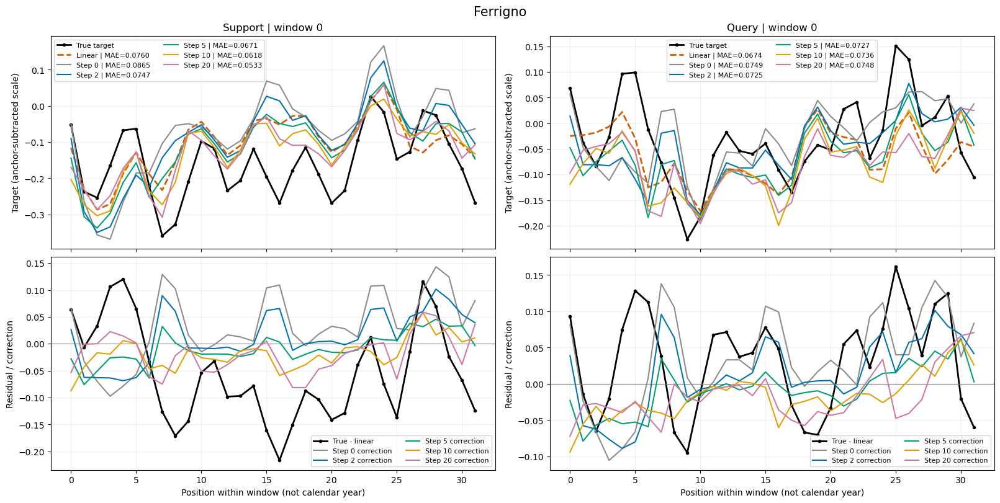

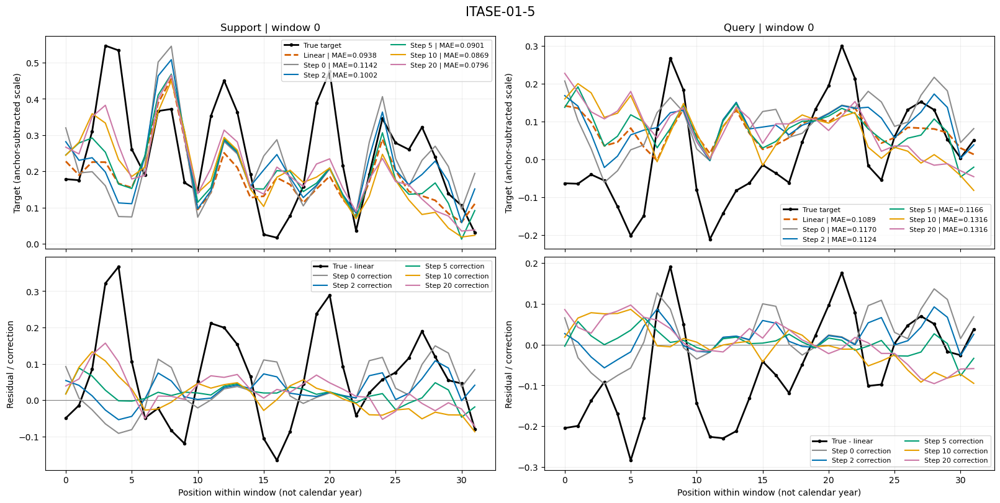

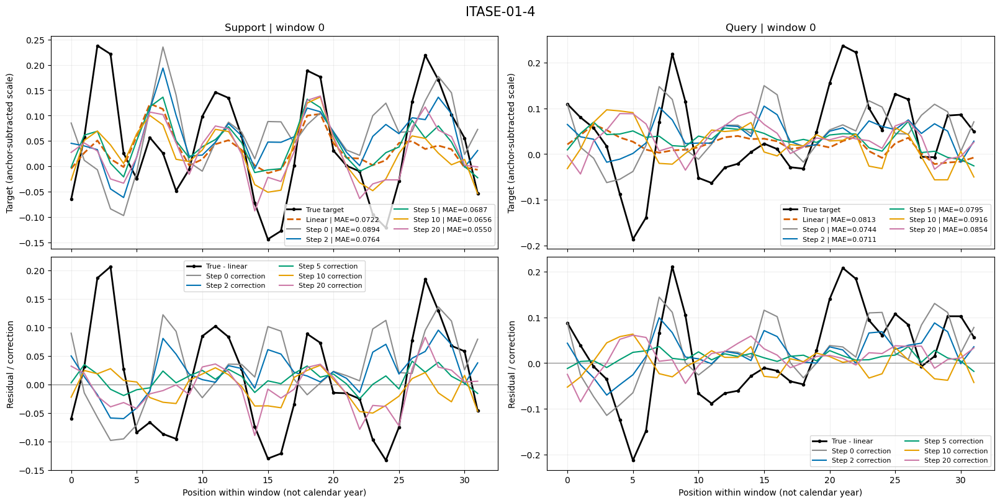

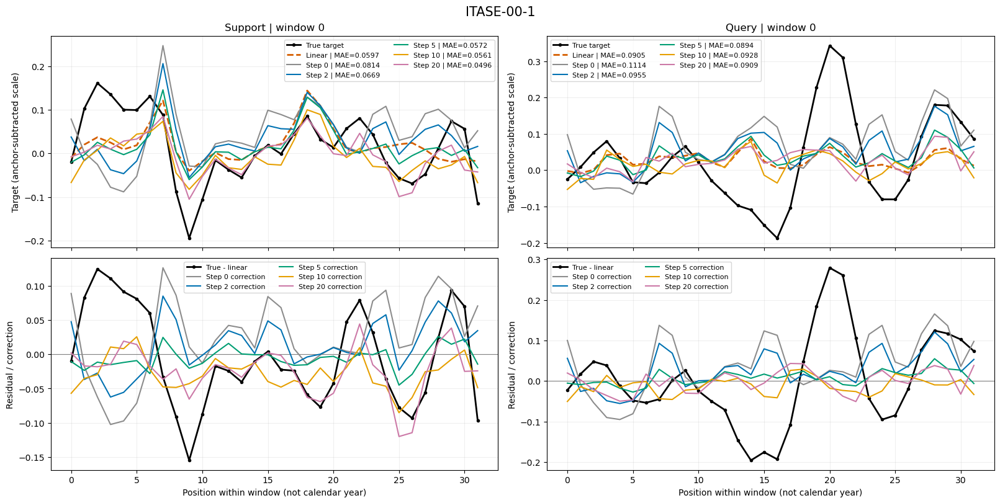

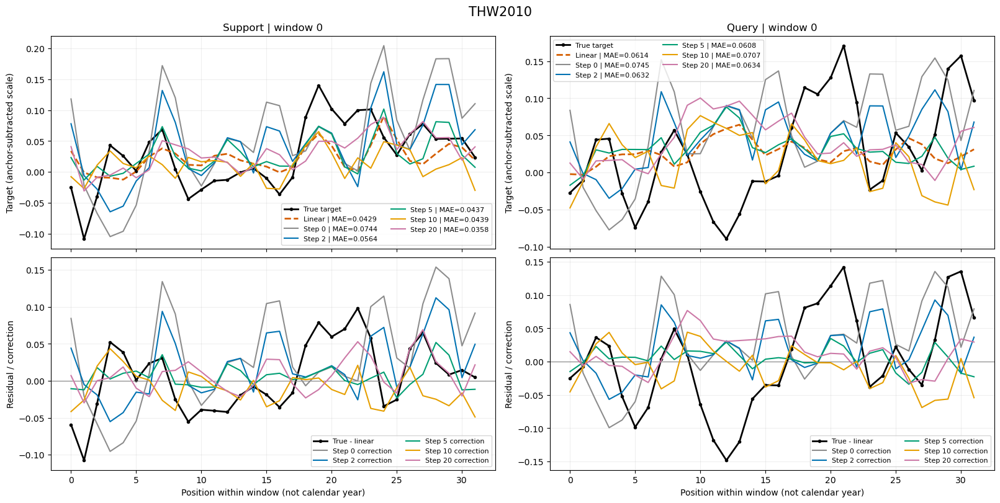

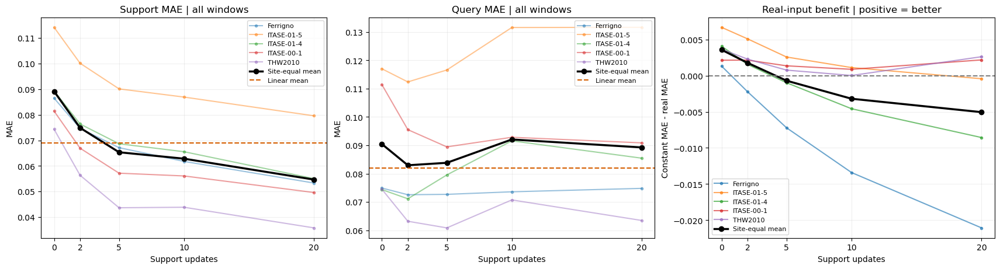

step    support MAE    query MAE    constant query MAE
   0    0.08917        0.09044      0.09400
   2    0.07491        0.08294      0.08470
   5    0.06536        0.08381      0.08310
  10    0.06284        0.09205      0.08885
  20    0.05467        0.08924      0.08418


In [1]:
# Specified validation NPZ: run this cell independently of earlier notebook cells.
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

root = Path('/Users/liulei/Desktop/SEMPO_copy0707')
npz_path = root / (
    'test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/'
    'chem_accum_crossvar_relation_pretrain_proto_k3_no_projection.npz_'
    'ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/'
    'summarize_fivefold.py/val_residual_steps.npz'
)
sites_to_plot = None  # None: all five sites; or ['Ferrigno', 'ITASE-01-5']
window_id = 0         # 0/1/2: choose the same window index for support and query
steps = (0, 2, 5, 10, 20)
colors = dict(zip(steps, ('#8c8c8c', '#0072B2', '#009E73', '#E69F00', '#CC79A7')))
with np.load(npz_path, allow_pickle=False) as archive:
    data = {key: archive[key] for key in archive.files}
sites = data['sites'].astype(str).tolist()
selected = sites if sites_to_plot is None else sites_to_plot
assert selected and set(selected) <= set(sites), f'Available sites: {sites}'
print(f'Source: {npz_path}')
print('Curves: one window. MAE: all windows, overlapping years counted repeatedly.')

# Each site: columns = support/query; rows = combined prediction/residual correction.
for site in selected:
    i = sites.index(site)
    fig, axes = plt.subplots(2, 2, figsize=(16, 8), sharex='col', constrained_layout=True)
    for col, split in enumerate(('support', 'query')):
        prefix = f'site_{i}_{split}'
        true, linear = data[f'{prefix}_true'], data[f'{prefix}_linear']
        assert true.shape == linear.shape and true.ndim == 3 and true.shape[-1] == 1
        assert 0 <= window_id < len(true), f'{site} {split}: invalid window_id'
        x = np.arange(true.shape[1])
        residual = true - linear
        axes[0, col].plot(x, true[window_id, :, 0], 'k.-', lw=2, label='True target')
        axes[0, col].plot(x, linear[window_id, :, 0], '--', color='#D55E00', lw=2,
                         label=f'Linear | MAE={np.abs(residual).mean():.4f}')
        axes[1, col].plot(x, residual[window_id, :, 0], 'k.-', lw=2, label='True - linear')
        axes[1, col].axhline(0, color='gray', lw=0.8)
        for step in steps:
            pred = data[f'{prefix}_pred_step{step}']
            assert pred.shape == true.shape and np.isfinite(pred).all()
            axes[0, col].plot(x, pred[window_id, :, 0], color=colors[step],
                             label=f'Step {step} | MAE={np.abs(pred - true).mean():.4f}')
            axes[1, col].plot(x, (pred - linear)[window_id, :, 0], color=colors[step],
                             label=f'Step {step} correction')
        axes[0, col].set_title(f'{split.capitalize()} | window {window_id}')
        axes[0, col].set_ylabel('Target (anchor-subtracted scale)')
        axes[1, col].set_ylabel('Residual / correction')
        axes[1, col].set_xlabel('Position within window (not calendar year)')
    for ax in axes.flat:
        ax.grid(alpha=0.2)
        ax.legend(fontsize=8, ncol=2)
    fig.suptitle(site, fontsize=15)
    plt.show()

# All five sites, regardless of sites_to_plot: site-equal mean of window-weighted MAE.
mae = {}
linear_mae = {}
for split in ('support', 'query'):
    mae[split] = np.array([
        [np.abs(data[f'site_{i}_{split}_pred_step{s}'] - data[f'site_{i}_{split}_true']).mean()
         for s in steps] for i in range(len(sites))
    ])
    linear_mae[split] = np.array([
        np.abs(data[f'site_{i}_{split}_linear'] - data[f'site_{i}_{split}_true']).mean()
        for i in range(len(sites))
    ])
constant_mae = np.array([
    [np.abs(data[f'site_{i}_query_linear'] + data[f'site_{i}_query_constant_correction_step{s}']
            - data[f'site_{i}_query_true']).mean() for s in steps]
    for i in range(len(sites))
])
fig, axes = plt.subplots(1, 3, figsize=(17, 4.5), constrained_layout=True)
for ax, split in zip(axes[:2], ('support', 'query')):
    for i, site in enumerate(sites):
        ax.plot(steps, mae[split][i], '.-', alpha=0.45, label=site)
    ax.plot(steps, mae[split].mean(axis=0), 'ko-', lw=2.5, label='Site-equal mean')
    ax.axhline(linear_mae[split].mean(), color='#D55E00', ls='--', label='Linear mean')
    ax.set_title(f'{split.capitalize()} MAE | all windows')
    ax.set_ylabel('MAE')
# Positive values mean real query chem improves over constant input.
for i, site in enumerate(sites):
    axes[2].plot(steps, constant_mae[i] - mae['query'][i], '.-', alpha=0.65, label=site)
axes[2].plot(steps, (constant_mae - mae['query']).mean(axis=0), 'ko-', lw=2.5, label='Site-equal mean')
axes[2].axhline(0, color='gray', ls='--')
axes[2].set_title('Real-input benefit | positive = better')
axes[2].set_ylabel('Constant MAE - real MAE')
for ax in axes:
    ax.set_xticks(steps)
    ax.set_xlabel('Support updates')
    ax.grid(alpha=0.2)
    ax.legend(fontsize=8)
plt.show()
print('step    support MAE    query MAE    constant query MAE')
for j, step in enumerate(steps):
    print(f'{step:>4}    {mae["support"][:, j].mean():.5f}        '
          f'{mae["query"][:, j].mean():.5f}      {constant_mae[:, j].mean():.5f}')


NPZ: /Users/liulei/Desktop/SEMPO_copy0707/test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/chem_accum_crossvar_relation_pretrain_proto_k3_no_projection.npz_ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/summarize_fivefold.py/val_residual_steps.npz
Checkpoint: /Users/liulei/Desktop/SEMPO_copy0707/results/cv_chem_linear_residual_no_projection_patch_head/checkpoints/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/chem_accum_crossvar_relation_pretrain_proto_k3_no_projection.npz_ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/checkpoint.pth
Bias contribution RMS: 0.0003594586837685607


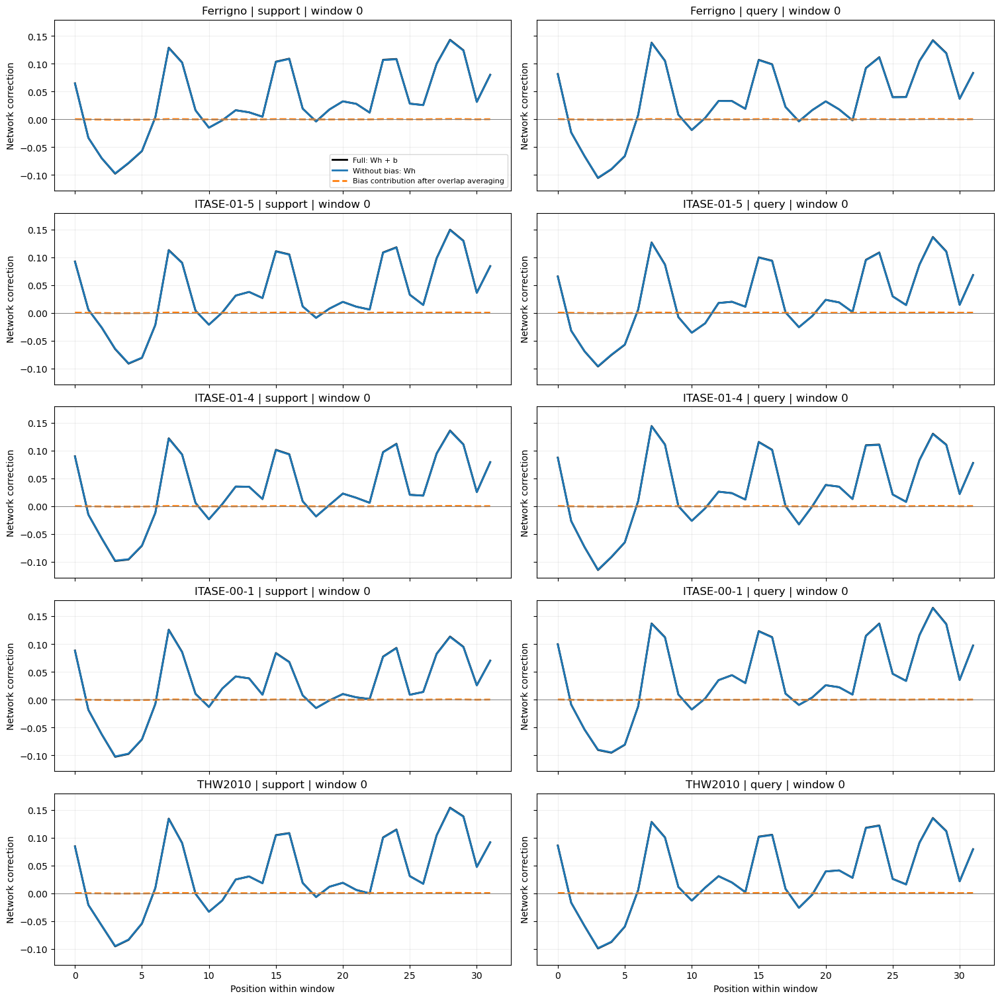

In [2]:
import torch

# 必须是生成当前 NPZ 的同一个 checkpoint；不自动挑“最新”文件。
checkpoint_root = (
    root / "results"
    / "cv_chem_linear_residual_no_projection_patch_head"
    / "checkpoints"
)
matches = sorted(checkpoint_root.glob("**/*fold0/checkpoint.pth"))
if len(matches) != 1:
    raise ValueError(f"请明确指定 checkpoint_path，找到：{matches}")
checkpoint_path = matches[0]

state = torch.load(
    checkpoint_path, map_location="cpu", weights_only=True
)
bias = (
    state["pretrain_heads.0.linear.bias"]
    .detach().double().numpy()
)

# 当前头：3个patch，每个16年，起点0、8、16。
# 与 SharedPatchPredictionHead 相同的重叠平均。
assert bias.shape == (16,)
bias_curve = np.zeros(32)
counts = np.zeros(32)
for start in (0, 8, 16):
    bias_curve[start:start + 16] += bias
    counts[start:start + 16] += 1
bias_curve /= counts

with np.load(npz_path, allow_pickle=False) as archive:
    saved = {key: archive[key] for key in archive.files}

site_names = saved["sites"].astype(str).tolist()
window_id = 0  # 改成1、2，可以比较其他窗口

print("NPZ:", npz_path)
print("Checkpoint:", checkpoint_path)
print("Bias contribution RMS:", np.sqrt(np.mean(bias_curve**2)))

fig, axes = plt.subplots(
    len(site_names), 2,
    figsize=(15, 3 * len(site_names)),
    sharex=True, sharey=True,
    constrained_layout=True,
)

for i, site in enumerate(site_names):
    for col, split in enumerate(("support", "query")):
        prefix = f"site_{i}_{split}"
        full = (
            saved[f"{prefix}_pred_step0"].astype(float)
            - saved[f"{prefix}_linear"].astype(float)
        )
        assert full.shape[1:] == (32, 1)
        assert 0 <= window_id < len(full)

        bias_output = np.broadcast_to(
            bias_curve[None, :, None], full.shape
        )
        no_bias = full - bias_output
        assert np.allclose(full, no_bias + bias_output)

        ax = axes[i, col]
        ax.plot(
            full[window_id, :, 0],
            color="black", lw=2, label="Full: Wh + b",
        )
        ax.plot(
            no_bias[window_id, :, 0],
            color="tab:blue", lw=2, label="Without bias: Wh",
        )
        ax.plot(
            bias_curve,
            color="tab:orange", ls="--", lw=2,
            label="Bias contribution after overlap averaging",
        )
        ax.axhline(0, color="gray", lw=0.7)
        ax.set_title(f"{site} | {split} | window {window_id}")
        ax.set_ylabel("Network correction")
        ax.grid(alpha=0.2)

axes[0, 0].legend(fontsize=8)
for ax in axes[-1]:
    ax.set_xlabel("Position within window")
plt.show()

Source: /Users/liulei/Desktop/SEMPO_copy0707/test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/chem_accum_crossvar_relation_pretrain_proto_k3_prefix_fixed.npz_ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/train_step0/val_residual_steps.npz
Train sites (15): ['Bruce Plateau', 'FB9814', 'ITASE-00-4', 'ITASE-01-3', 'ITASE-00-3', 'SPOLE 0EW', 'Fimbulisen s100', 'UP-C', 'DIV2010', 'ITASE-01-1', 'Gomez', 'ITASE-01-2', 'Law Dome (2015)', 'RIDS-A', 'FB9809']
No adaptation. Plot legends use the displayed window MAE.


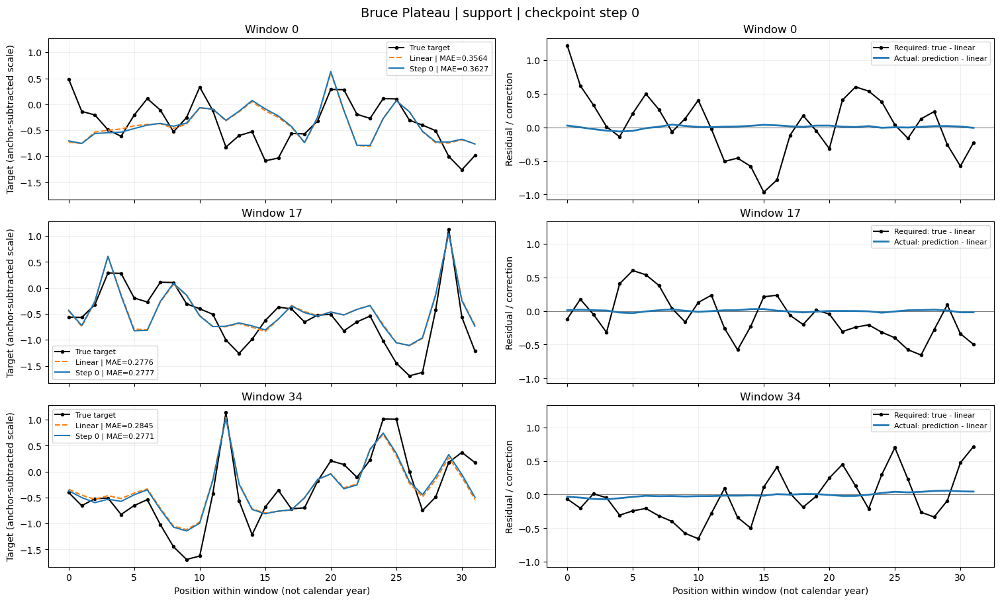

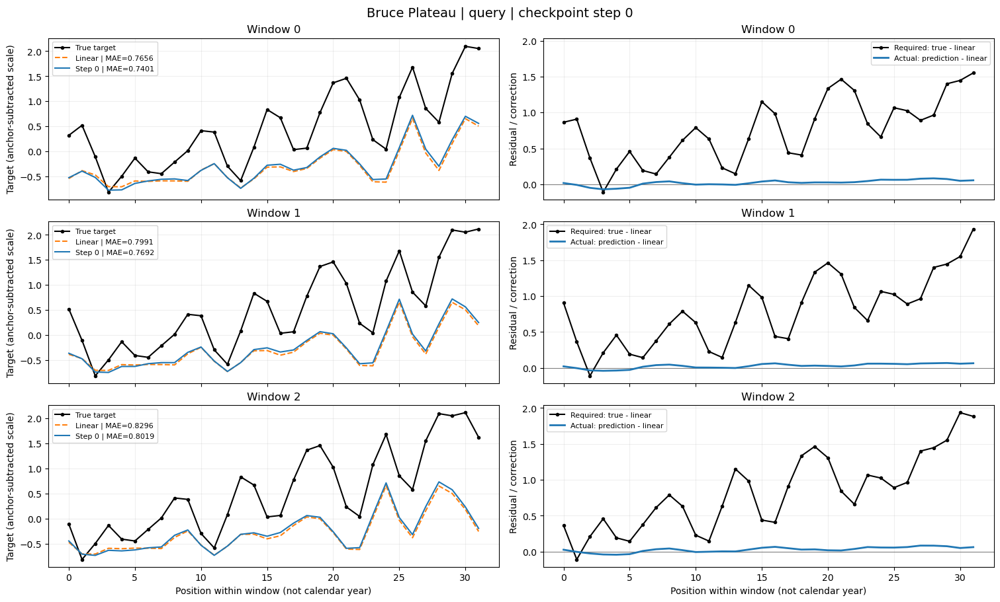

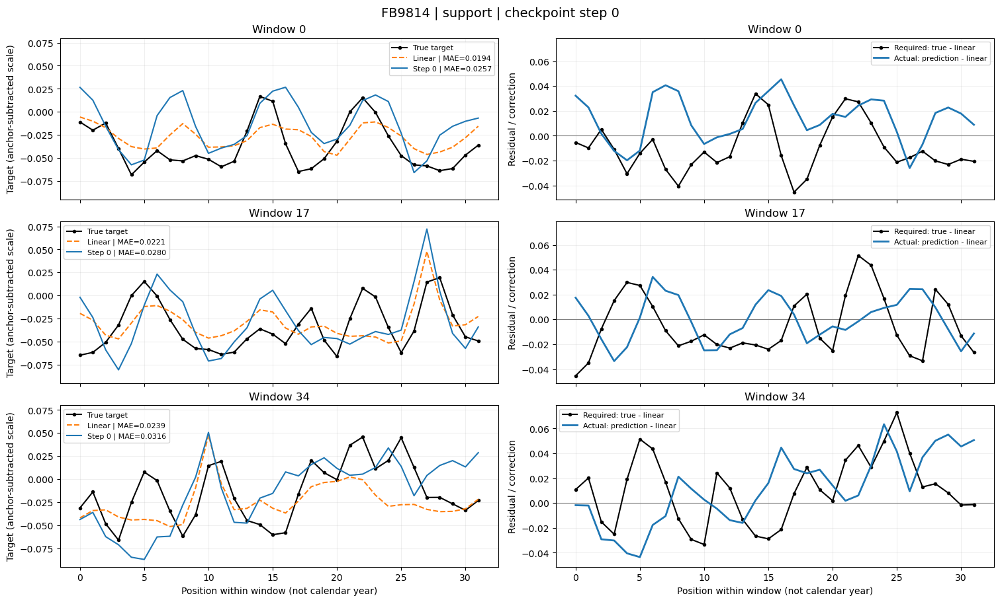

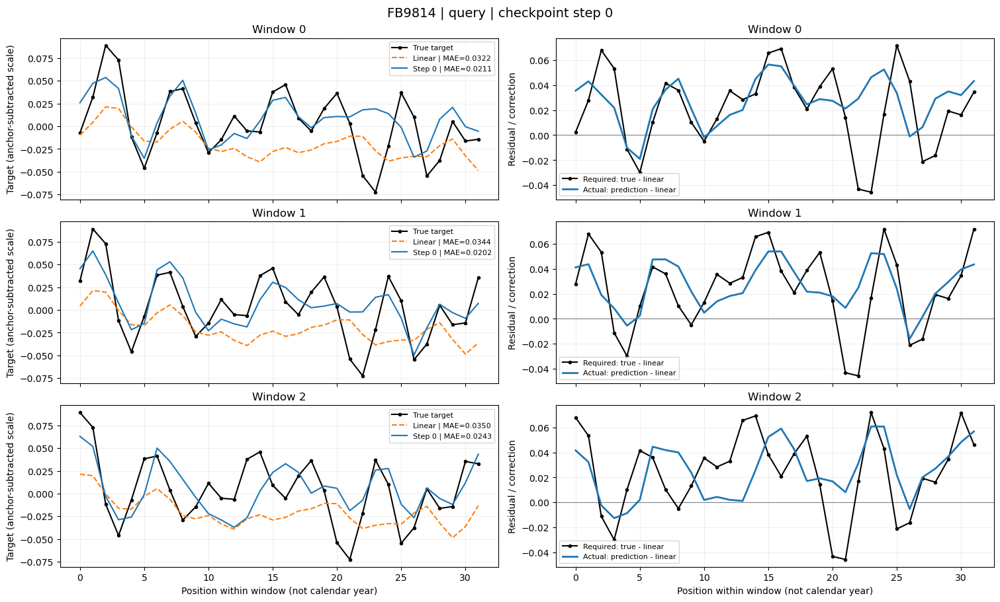

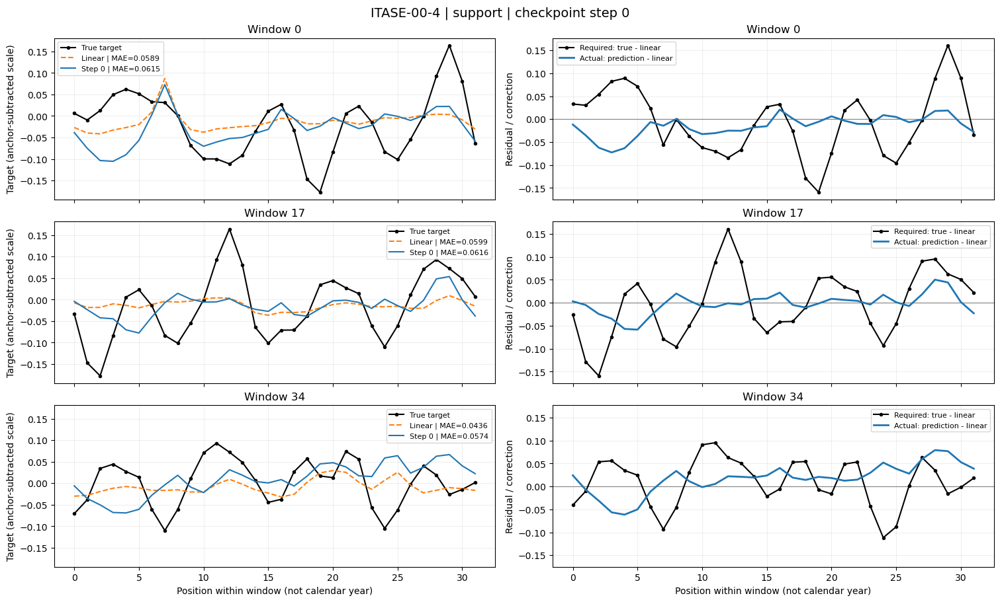

...

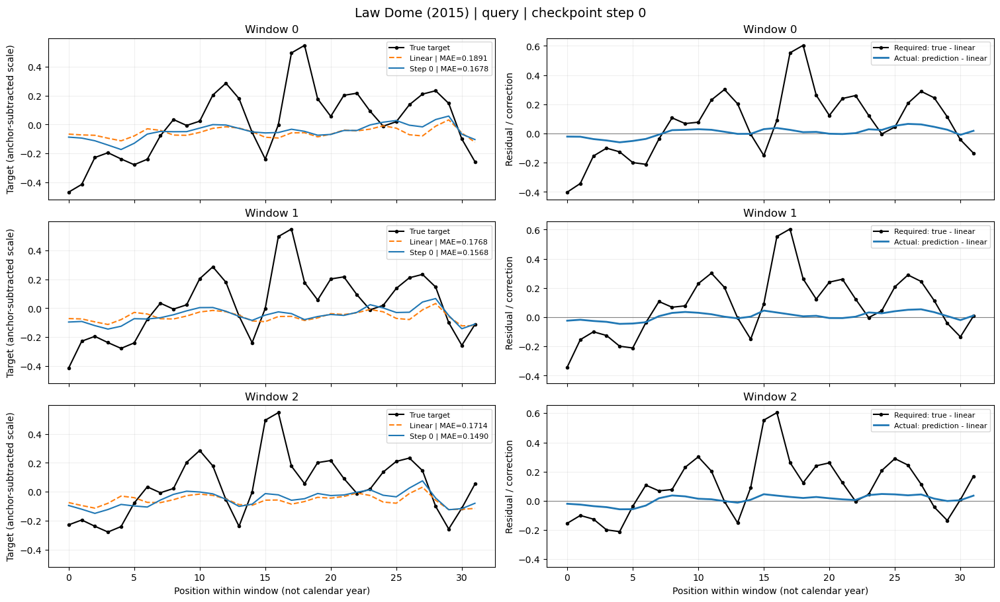

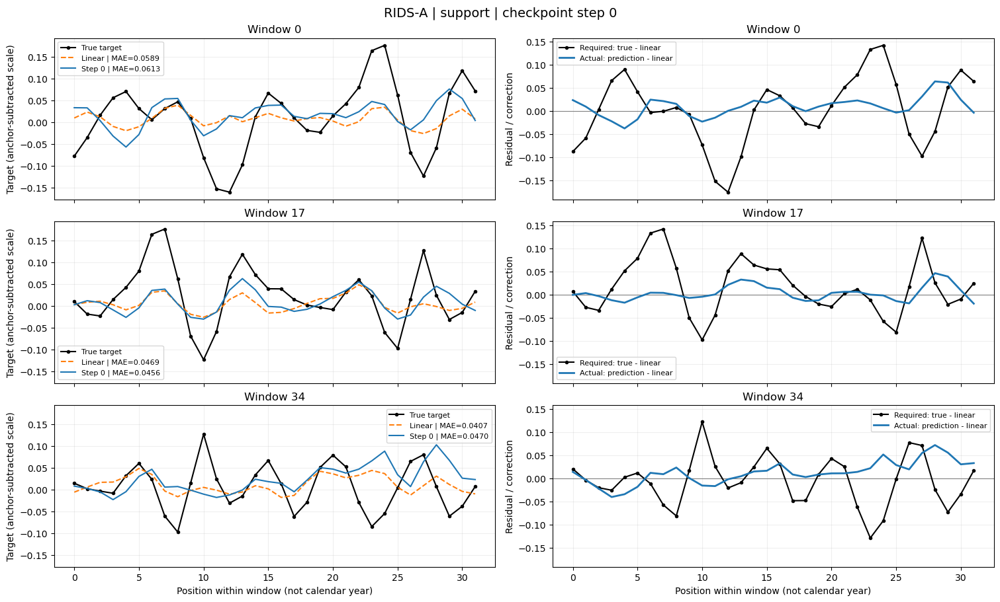

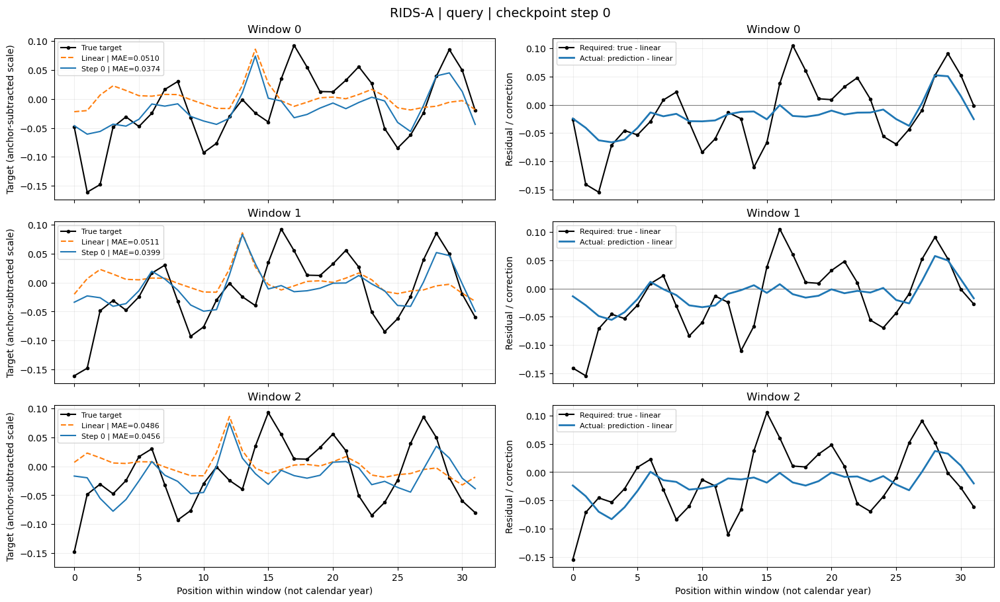

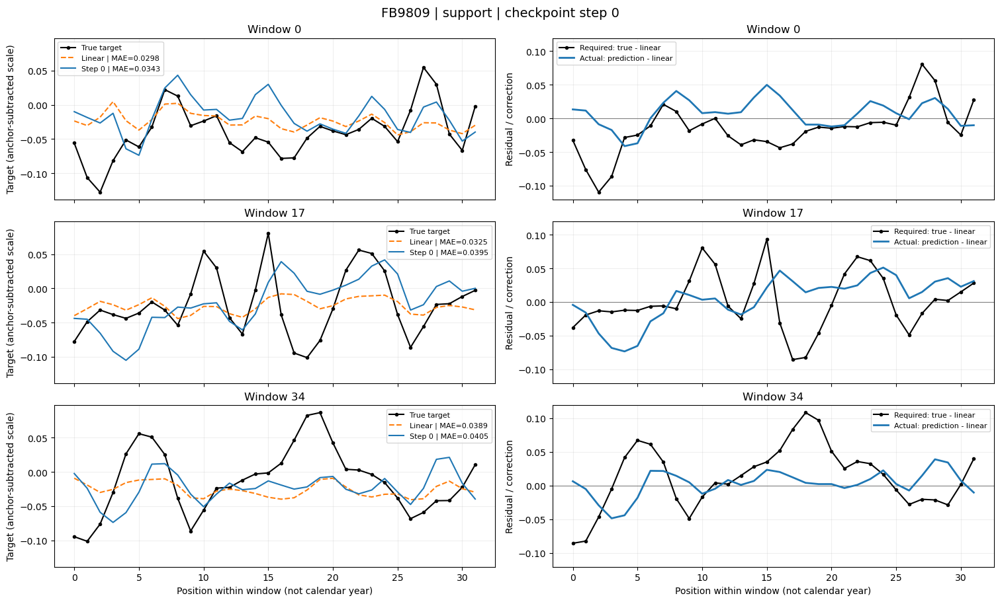

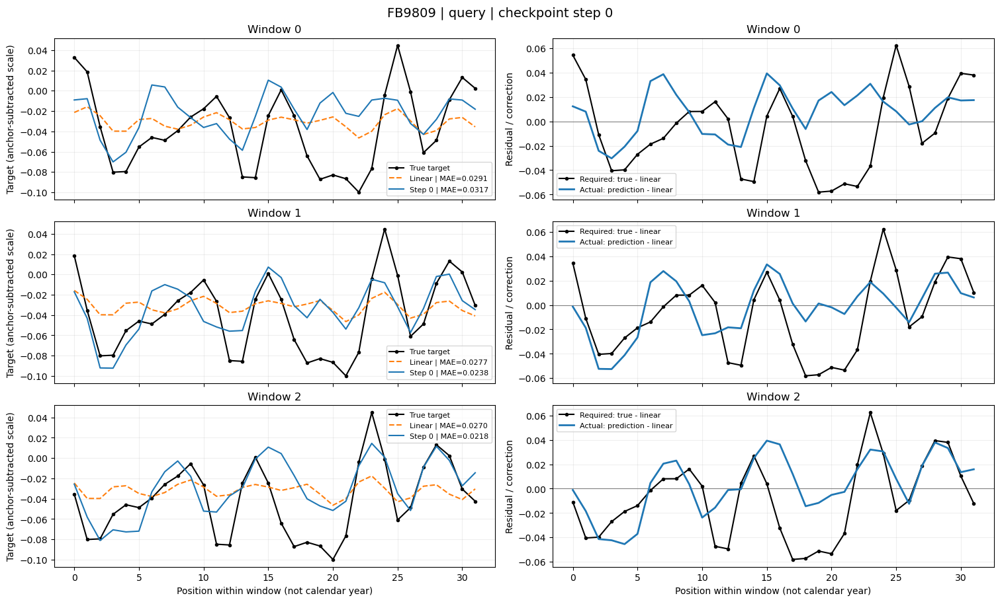


ALL-window MAE (not just the displayed windows)
Site               Split        Linear      Step0
Bruce Plateau      support     0.28902    0.28878
Bruce Plateau      query       0.79806    0.77039
FB9814             support     0.02211    0.02500
FB9814             query       0.03387    0.02188
ITASE-00-4         support     0.05452    0.05477
ITASE-00-4         query       0.04041    0.04183
ITASE-01-3         support     0.06445    0.06926
ITASE-01-3         query       0.09255    0.08296
ITASE-00-3         support     0.06329    0.06985
ITASE-00-3         query       0.14118    0.13164
SPOLE 0EW          support     0.02511    0.03342
SPOLE 0EW          query       0.04276    0.04856
Fimbulisen s100    support     0.11162    0.11518
Fimbulisen s100    query       0.29290    0.25607
UP-C               support     0.03831    0.04027
UP-C               query       0.04827    0.03823
DIV2010            support     0.07068    0.07267
DIV2010            query       0.10261    0.09370
I

In [4]:
# Train sites, frozen checkpoint: run this cell independently.
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

root = Path('/Users/liulei/Desktop/SEMPO_copy0707')
# npz_path = root / (
#     'test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/'
#     'chem_accum_crossvar_relation_pretrain_proto_k3_no_projection.npz_'
#     'ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/'
#     'train_step0/val_residual_steps.npz'
# )
npz_path = root / (
    'test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/chem_accum_crossvar_relation_pretrain_proto_k3_prefix_fixed.npz_ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/train_step0/val_residual_steps.npz'
)
sites_to_plot = None  # None = all train sites; or a list of names printed below
windows_to_plot = {'support': [0, 17, 34], 'query': [0, 1, 2]}

with np.load(npz_path, allow_pickle=False) as archive:
    data = {key: archive[key] for key in archive.files}
sites = data['sites'].astype(str).tolist()
selected = sites if sites_to_plot is None else sites_to_plot
assert selected and set(selected) <= set(sites), f'Available sites: {sites}'
print('Source:', npz_path)
print(f'Train sites ({len(sites)}):', sites)
print('No adaptation. Plot legends use the displayed window MAE.')

# Summary uses ALL windows; overlapping years count repeatedly.
summary = []
for site in sites:
    i = sites.index(site)
    for split in ('support', 'query'):
        prefix = f'site_{i}_{split}'
        true = data[f'{prefix}_true'][:, :, 0]
        linear = data[f'{prefix}_linear'][:, :, 0]
        pred = data[f'{prefix}_pred_step0'][:, :, 0]
        assert true.shape == linear.shape == pred.shape
        assert np.isfinite(np.stack([true, linear, pred])).all()
        summary.append((site, split, np.abs(linear - true).mean(), np.abs(pred - true).mean()))
        if site not in selected:
            continue
        window_ids = windows_to_plot[split]
        assert window_ids and all(0 <= w < len(true) for w in window_ids), (
            f'{site} {split}: valid window indices 0..{len(true)-1}'
        )
        residual, correction = true - linear, pred - linear
        fig, axes = plt.subplots(len(window_ids), 2, squeeze=False, sharex=True,
                                 sharey='col', figsize=(15, 3 * len(window_ids)),
                                 constrained_layout=True)
        for row, w in enumerate(window_ids):
            x = np.arange(true.shape[1])
            ax = axes[row, 0]
            ax.plot(x, true[w], 'k.-', label='True target')
            ax.plot(x, linear[w], '--', color='tab:orange',
                    label=f'Linear | MAE={np.abs(residual[w]).mean():.4f}')
            ax.plot(x, pred[w], color='tab:blue',
                    label=f'Step 0 | MAE={np.abs(pred[w] - true[w]).mean():.4f}')
            ax.set_ylabel('Target (anchor-subtracted scale)')
            ax = axes[row, 1]
            ax.axhline(0, color='gray', lw=0.8)
            ax.plot(x, residual[w], 'k.-', label='Required: true - linear')
            ax.plot(x, correction[w], color='tab:blue', lw=2,
                    label='Actual: prediction - linear')
            ax.set_ylabel('Residual / correction')
            for ax in axes[row]:
                ax.set_title(f'Window {w}')
                ax.grid(alpha=0.2)
                ax.legend(fontsize=8)
        for ax in axes[-1]:
            ax.set_xlabel('Position within window (not calendar year)')
        fig.suptitle(f'{site} | {split} | checkpoint step 0', fontsize=14)
        plt.show()

print('\nALL-window MAE (not just the displayed windows)')
print(f'{"Site":<18} {"Split":<8} {"Linear":>10} {"Step0":>10}')
for site, split, linear_mae, pred_mae in summary:
    print(f'{site:<18} {split:<8} {linear_mae:10.5f} {pred_mae:10.5f}')
for split in ('support', 'query'):
    values = np.array([(a, b) for _, part, a, b in summary if part == split])
    print(f'Site-equal mean {split}: linear={values[:, 0].mean():.5f}, '
          f'step0={values[:, 1].mean():.5f}')
